# Primeiros passos

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/intrig-unicamp/hackathon5G/blob/main/challenges/get-started.ipynb)

Esse Notebook contém breves casos de uso de aplicações de métodos de aprendizado de máquina nos conjuntos de dados disponibilizados para demonstrar os primeiros passos para se abordar os desafios propostos.

## Instalação das dependências

Instalar as dependências no ambiente adequado (pip ou Anaconda).

In [1]:
try:
    import google.colab as _
    IN_COLAB = True
except:
    IN_COLAB = False

if IN_COLAB:
    !pip install pyshark pandas numpy seaborn scikit-learn plotly -q
else:
    !conda install pyshark pandas numpy seaborn scikit-learn plotly -qy --freeze-installed

In [2]:
%%bash

if type tshark >/dev/null 2>&1; then
    echo "tshask already installed"

elif type nix-env >/dev/null 2>&1; then
    nix-env -iA nixpkgs.tshark

elif type apt-get >/dev/null 2>&1; then
    apt-get -q install tshark

elif type yum >/dev/null 2>&1; then
    yum install tshark -q -y

elif type apk >/dev/null 2>&1; then
    apk add -q tshark

elif type pacman >/dev/null 2>&1; then
    pacman -S tshark

fi

tshask already installed


## Importando dependências globais

In [3]:
from IPython.display import display, Markdown
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.metrics.pairwise import haversine_distances

import pyshark

# https://github.com/KimiNewt/pyshark/issues/360#issuecomment-700425352
import nest_asyncio
nest_asyncio.apply()

import os
from datetime import datetime
from math import radians
import json
from urllib.parse import urlparse, parse_qsl

pd.set_option('display.max_columns', None)

def count_decimal_places(num):
    str_num = str(num)
    if '.' in str_num:
        return len(str_num) - str_num.index('.') - 1
    else:
        return 0

pd.set_option('display.float_format', lambda x: '{:.{}f}'.format(x, min(count_decimal_places(x), 6)))

def pd_insert_beside(df, column_name, value):
    df.insert(df.columns.get_loc(value.name) + 1, column_name, value)

## Obtendo arquivos de dados

Baixamos os arquivos caso o Notebook esteja sendo executado no ambiente do Google Colab. A variável de prefixo do caminho dos arquivos é definida de acordo.

In [4]:
DATA_PATH_PREFIX = './hackathon5G/datasets' if IN_COLAB else '../datasets'
GNETTRACKPRO_PATH = f'{DATA_PATH_PREFIX}/g-nettrack-pro'
YOUTUBE_QOE_PCAP_PATH = f'{DATA_PATH_PREFIX}/youtube-qoe-pcap'

if IN_COLAB:
    !git clone --depth=1 https://github.com/intrig-unicamp/hackathon5G.git hackathon5G

if not os.path.exists(f'{YOUTUBE_QOE_PCAP_PATH}/PCAPdroid_24_Feb_16_35_24.pcapng'):
    !wget --content-disposition --directory-prefix {YOUTUBE_QOE_PCAP_PATH} "https://docs.google.com/uc?export=download&confirm=t&id=1vDJ92Y06Grnnxo6l31vBX7A0dNKGXS62"

## Carregando os dados

### G-NetTrack

In [5]:
datasets = [ file for file in os.listdir(GNETTRACKPRO_PATH) if file.endswith('.txt') ]

gnetDf = pd.concat([ pd.read_csv(f'{GNETTRACKPRO_PATH}/{dataset}', sep='\t', low_memory=False, on_bad_lines='warn') for dataset in datasets ]).copy()
gnetDf.drop(gnetDf.loc[gnetDf.Timestamp == 'Timestamp'].index, inplace=True)
gnetDf.Timestamp = pd.to_datetime(gnetDf.Timestamp, format='%Y.%m.%d_%H.%M.%S')
pd_insert_beside(gnetDf, 'Timestamp_seconds', gnetDf.Timestamp.astype(int) / 10**9)
gnetDf.sort_values('Timestamp', inplace=True, ignore_index=True)
gnetDf.replace({
    'Altitude': { '--': np.nan },
    'CHARGING': { 'true': True, 'false': False },
    **{ k: { '--': np.nan } for k in ['Longitude', 'Latitude', 'NetworkTech', 'Accuracy'] },
    **{ k: { '-': np.nan } for k in ['CQI', 'SNR', 'Qual', 'LTERSSI'] },
}, inplace=True)
gnetDf = gnetDf.astype({
    **{ k: 'string' for k in ['NetworkTech', 'NetworkMode', 'Location', 'State', 'EVENT', 'CGI', 'Node', 'CellID', 'LAC', 'Operatorname', 'Operator', 'IP'] },
    **{ k: np.float64 for k in ['Longitude', 'Latitude', 'Speed', 'Accuracy', 'SNR', 'Level', 'Qual', 'CQI', 'LTERSSI', 'ARFCN', 'DL_bitrate', 'UL_bitrate', 'PSC', 'Altitude', 'Height'] },
    **{ k: np.int32 for k in ['BATTERY'] },
})
gnetDf.replace({
    'Altitude': { 0: np.nan },
    'Height': { 0: np.nan, -10000: np.nan },
    'Speed': { -99: np.nan },
}, inplace=True)
gnetDf

Skipping line 1291: expected 260 fields, saw 390
Skipping line 1292: expected 260 fields, saw 390
Skipping line 1293: expected 260 fields, saw 390
Skipping line 1294: expected 260 fields, saw 390
Skipping line 1295: expected 260 fields, saw 390
Skipping line 1296: expected 260 fields, saw 390
Skipping line 1297: expected 260 fields, saw 390
Skipping line 1298: expected 260 fields, saw 390
Skipping line 1299: expected 260 fields, saw 390
Skipping line 1300: expected 260 fields, saw 390
Skipping line 1301: expected 260 fields, saw 390
Skipping line 1302: expected 260 fields, saw 390
Skipping line 1303: expected 260 fields, saw 390
Skipping line 1304: expected 260 fields, saw 390
Skipping line 1305: expected 260 fields, saw 390
Skipping line 1306: expected 260 fields, saw 390
Skipping line 1307: expected 260 fields, saw 390
Skipping line 1308: expected 260 fields, saw 390
Skipping line 1309: expected 260 fields, saw 390
Skipping line 1310: expected 260 fields, saw 390
Skipping line 1311: 

,Timestamp,Timestamp_seconds,Longitude,Latitude,Speed,Operatorname,Operator,CGI,Cellname,Node,CellID,LAC,NetworkTech,NetworkMode,Level,Qual,SNR,CQI,LTERSSI,ARFCN,DL_bitrate,UL_bitrate,PSC,Altitude,Height,Accuracy,Location,State,PINGAVG,PINGMIN,PINGMAX,PINGSTDEV,PINGLOSS,TESTDOWNLINK,TESTUPLINK,TESTDOWNLINKMAX,TESTUPLINKMAX,Test_Status,DataConnection_Type,DataConnection_Info,Layer,Filemark,IMEI,Distance,Bearing,IP,TA,EVENT,EVENTDETAILS,IMSI,MSISDN,SERVINGTIME,CELLHEX,NODEHEX,LACHEX,RAWCELLID,VERSION_NAME,VERSION_CODE,DEVICE,BAND,BANDWIDTH,INFO,SecondCell_NODE,SecondCell_CELLID,SecondCell_RSRP,SecondCell_RSRQ,SecondCell_SNR,CSI_RSRP,CSI_RSRQ,CSI_SNR,NetworkTypeNum,CA,SecondCell_PSC,SecondCell_ARFCN,SecondCell_BAND,Site_BEARING,BATTERY,CHARGING,NRSTATE,R4,NTech1,NCellName1,NCellid1,NLAC1,NCell1,NARFCN1,NRxLev1,NQual1,NDistance1,NBearing1,NTech2,NCellName2,NCellid2,NLAC2,NCell2,NARFCN2,NRxLev2,NQual2,NDistance2,NBearing2,NTech3,NCellName3,NCellid3,NLAC3,NCell3,NARFCN3,NRxLev3,NQual3,NDistance3,NBearing3,NTech4,NCellName4,NCellid4,NLAC4,NCell4,NARFCN4,NRxLev4,NQual4,NDistance4,NBearing4,NTech5,NCellName5,NCellid5,NLAC5,NCell5,NARFCN5,NRxLev5,NQual5,NDistance5,NBearing5,NTech6,NCellName6,NCellid6,NLAC6,NCell6,NARFCN6,NRxLev6,NQual6,NDistance6,NBearing6,NTech7,NCellName7,NCellid7,NLAC7,NCell7,NARFCN7,NRxLev7,NQual7,NDistance7,NBearing7,NTech8,NCellName8,NCellid8,NLAC8,NCell8,NARFCN8,NRxLev8,NQual8,NDistance8,NBearing8,NTech9,NCellName9,NCellid9,NLAC9,NCell9,NARFCN9,NRxLev9,NQual9,NDistance9,NBearing9,NTech10,NCellName10,NCellid10,NLAC10,NCell10,NARFCN10,NRxLev10,NQual10,NDistance10,NBearing10,NTech11,NCellName11,NCellid11,NLAC11,NCell11,NARFCN11,NRxLev11,NQual11,NDistance11,NBearing11,NTech12,NCellName12,NCellid12,NLAC12,NCell12,NARFCN12,NRxLev12,NQual12,NDistance12,NBearing12,NTech13,NCellName13,NCellid13,NLAC13,NCell13,NARFCN13,NRxLev13,NQual13,NDistance13,NBearing13,NTech14,NCellName14,NCellid14,NLAC14,NCell14,NARFCN14,NRxLev14,NQual14,NDistance14,NBearing14,NTech15,NCellName15,NCellid15,NLAC15,NCell15,NARFCN15,NRxLev15,NQual15,NDistance15,NBearing15,NTech16,NCellName16,NCellid16,NLAC16,NCell16,NARFCN16,NRxLev16,NQual16,NDistance16,NBearing16,NTech17,NCellName17,NCellid17,NLAC17,NCell17,NARFCN17,NRxLev17,NQual17,NDistance17,NBearing17,NTech18,NCellName18,NCellid18,NLAC18,NCell18,NARFCN18,NRxLev18,NQual18,NDistance18,NBearing18,Unnamed: 259
0,2023-01-21 14:44:46,1674312286.0,NaN,NaN,NaN,CLARO_BR,72405,724056481100018,NaN,113726,18,64811,4G,LTE,-110.0,-8.0,16.0,14.0,-61.0,1400.0,25.0,29.0,111.0,NaN,NaN,NaN,<NA>,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,M,13,1,NaN,NaN,0,0,10.130.154.201,31.0,LOG START,NaN,NaN,NaN,8,12,1BC3E,FD2B,29113874,27.5,535,samsung:SM-G991B:TP1A.220624.014,L3,10/20/15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,False,NaN,NaN,NaN,0,81,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2023-01-21 14:44:46,1674312286.0,NaN,NaN,NaN,CLARO_BR,72405,724056481100018,NaN,113726,18,64811,4G,LTE,-112.0,-8.0,17.0,14.0,-65.0,1400.0,119.0,53.0,111.0,NaN,NaN,NaN,<NA>,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,M,13,1,NaN,NaN,0,0,10.130.154.201,31.0,PERIODIC,NaN,NaN,NaN,9,12,1BC3E,FD2B,29113874,27.5,535,samsung:SM-G991B:TP1A.220624.014,L3,10/20/15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,False,NaN,NaN,NaN,0,81,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

### YouTube QoE

In [6]:
# https://developers.google.com/youtube/iframe_api_reference#getPlayerState
player_state_enum_map = {
    'N':  'unstarted/cued', # -1 = unstarted; 5 = video cued
    'EN': 'ended',   # 0
    'PL': 'playing', # 1
    'PA': 'paused',  # 2
    'B':  'buffering', # 3
    'S':  'seek',    # guess based on player interactions (reverse engineering)
}

# transform comma separated timestamp/at
def trans_comma_sep_at(transformer):
    def inner(value):
        # each value has entries separated by comma
        # each entry is in the form at:metric
        value = [ e.split(':') for e in value.split(',') ]
        # each metric is transformed based on a custom function
        value = [ { 'at': float(at), **transformer(*v) } for at, *v in value ]
        return value
    return inner

field_transformers = {
    'vps':  trans_comma_sep_at(lambda a: { 'value': player_state_enum_map.get(a, a) }),
    'cmt':  trans_comma_sep_at(lambda a: { 'value': float(a) }),
    'bh':   trans_comma_sep_at(lambda a: { 'value': float(a) }),
    'bwe':  trans_comma_sep_at(lambda a: { 'value':   int(a) }),
    'df':   trans_comma_sep_at(lambda a: { 'value':   int(a) }),
    'bwm':  trans_comma_sep_at(lambda a, b: { 'downloaded_bytes': int(a), 'seconds_to_download': float(b) }),
    'bat':  trans_comma_sep_at(lambda a, b: { 'percentage': float(a) * 100, 'is_charging': b == '1' }),
    'view': trans_comma_sep_at(lambda a, b, c: { 'width': int(a), 'height': int(b) }), # unknown 'c' value
}

array_fields = list(field_transformers.keys())

def youtube_qoe_column_transform(column, value):
    return field_transformers[column](value) if type(value) == str else value

def open_youtube_qoe_pcap(pcap_filename):
    # open_youtube_qoe_pcap
    res = pyshark.FileCapture(input_file=pcap_filename, display_filter='http2.header.value contains "api/stats/qoe"')

    # extract_youtube_qoe_urls_from_pcap
    res = [ { 'time': each.sniff_time, 'url': each.http2.headers_path } for each in res]

    # extract_youtube_qoe_metrics_from_urls
    res = [ { k: v for k, v in [('time', i['time'])] + parse_qsl(urlparse(i['url']).query) } for i in res ] # extract query params from URLs
    res = pd.DataFrame(res)

    return res

def explode_column_and_match_at(df, column_names):
    out = pd.DataFrame({ 'cpn': [], 'seq': [], 'at': [] })

    for c in column_names:
        exploded = df.explode(c)[['cpn', 'seq', c]]

        other_columns = exploded.drop(columns=[c]).reset_index(drop=True)
        c_columns = pd.json_normalize(exploded[c]).add_prefix(f'{c}.').rename(columns={f'{c}.at': 'at'})
        other_columns[list(c_columns)] = c_columns

        out = pd.merge(out, other_columns.dropna(), on=['cpn', 'seq', 'at'], how='outer')

    return out

datasets = [ file for file in os.listdir(YOUTUBE_QOE_PCAP_PATH) if file.endswith('.pcapng') ]

ytDf = pd.concat([ pd.DataFrame(open_youtube_qoe_pcap(f'{YOUTUBE_QOE_PCAP_PATH}/{dataset}')) for dataset in datasets ]).copy()

ytDf[array_fields] = ytDf[array_fields].apply(lambda x: x.apply(lambda y: youtube_qoe_column_transform(x.name, y)))

pd_insert_beside(ytDf, 'first_packet_time', ytDf.groupby('cpn').time.transform(lambda group: group.min()))
ytDf.drop('time', axis=1, inplace=True)
non_array_fields = [ c for c in ytDf.columns if c not in array_fields]

ytDf = pd.merge(ytDf[non_array_fields], explode_column_and_match_at(ytDf, array_fields), on=['cpn', 'seq'], how='inner')
ytDf.insert(0, 'session_time', ytDf.pop('at'))
ytDf.insert(0, 'time_seconds', ytDf.pop('first_packet_time').astype(int) / 10**9 + ytDf.session_time)
ytDf.insert(0, 'time', pd.to_datetime(ytDf.time_seconds, unit='s'))

ytDf.sort_values('time', inplace=True, ignore_index=True)

ytDf

,time,time_seconds,session_time,fmt,afmt,cpn,el,ns,fexp,cl,seq,docid,ei,event,plid,cbrand,cbr,cbrver,c,cver,cplayer,cmodel,cos,cosver,cplatform,afs,vfs,vis,conn,user_intent,ctmp,referrer,sdetail,sourceid,feature,content_v,adformat,adcontext,ad_playback,qoealert,vps.value,cmt.value,bh.value,bwe.value,df.value,bwm.downloaded_bytes,bwm.seconds_to_download,bat.percentage,bat.is_charging,view.width,view.height
0,2023-02-17 02:20:03.329911040,1676600403.329911,0.0,243,251,oMaRrct9XOA6WR0D,detailpage,yt,"23848211,23983296,24004644,24007246,24080738,2...",509820939,1,d5r-kEmQfBg,gA7vY83zJeyPobIPq_OcmAg,streamingstats,AAX03ncKwXUwJiIT,samsung,Chrome Mobile,109.0.0.0,MWEB,2.20230215.10.00,UNIPLAYER,sm-g991b,Android,13,MOBILE,0.008:251::i,0.008:243:243::d,0.008:0,0.008:1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unstarted/cued,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2023-02-17 02:20:03.337910784,1676600403.337911,0.008,243,251,oMaRrct9XOA6WR0D,detailpage,yt,"23848211,23983296,24004644,24007246,24080738,2...",509820939,1,d5r-kEmQfBg,gA7vY83zJeyPobIPq_OcmAg,streamingstats,AAX03ncKwXUwJiIT,samsung,Chrome Mobile,109.0.0.0,MWEB,2.20230215.10.00,UNIPLAYER,sm-g991b,Android,13,MOBILE,0.008:251::i,0.008:243:243::d,0.008:0,0.008:1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unstarted/cued,0.0,0.0,752419.0,NaN,NaN,NaN,NaN,NaN,360.0,203.0
2,2023-02-17 02:20:03.366910976,1676600403.366911,0.037,243,251,oMaRrct9XOA6WR0D,detailpage,yt,"23848211,23983296,24004644,24007246,24080738,2...",509820939,2,d5r-kEmQfBg,gA7vY83zJeyPobIPq_OcmAg,streamingstats,AAX03ncKwXUwJiIT,samsung,Chrome Mobile,109.0.0.0,MWEB,2.20230215.10.00,UNIPLAYER,sm-g991b,Android,13,MOBILE,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,buffering,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2023-02-17 02:20:04.187910912,1676600404.187911,0.858,243,251,oMaRrct9XOA6WR0D,detailpage,yt,"23848211,23983296,24004644,24007246,24080738,2...",509820939,2,d5r-kEmQfBg,gA7vY83zJeyPobIPq_OcmAg,streamingstats,AAX03ncKwXUwJiIT,samsung,Chrome Mobile,109.0.0.0,MWEB,2.20230215.10.00,UNIPLAYER,sm-g991b,Android,13,MOBILE,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,playing,0.063,7.401,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2023-02-17 02:20:04.939910912,1676600404.939911,1.61,243,251,oMaRrct9XOA6WR0D,detailpage,yt,"23848211,23983296,24004644,24007246,24080738,2...",509820939,2,d5r-kEmQfBg,gA7vY83zJeyPobIPq_OcmAg,streamingstats,AAX03ncKwXUwJiIT,samsung,Chrome Mobile,109.0.0.0,MWEB,2.20230215.10.00,UNIPLAYER,sm-g991b,Android,13,MOBILE,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.816,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
778,2023-02-24 20:33:24.100381952,1677270804.100382,10.008,396,251,8qT53QJIe-uAItWx,detailpage,yt,"23983296,24004644,24007246,24080738,24135310,2...",511930715,3,aqz-KE-bpKQ,OUn5Y_-AD-SQ4dUPy8ipgAE,streamingstats,AAX1eo2OhsF1-Khx,samsung,Chrome Mobile,110.0.0.0,MWEB,2.20230224.00.00,UNIPLAYER,sm-g991b,Android,13,MOBILE,NaN,NaN,NaN,NaN,NaN,NaN,https://m.youtube.com/watch?v=OHOpb2fS-cM&list...,p:m.youtube.com/watch,r,autoplay,NaN,NaN,NaN,NaN,NaN,playing,9.239,40.964,1008743.0,NaN,1722057.0,0.918,48.0,False,NaN,NaN
779,2023-02-24 20:34:04.099382016,1677270844.099382,50.007,396,251,8qT53QJIe-uAItWx,detailpage,yt,"23983296,24004644,24007246,24080738,24135310,2...",511930715,4,aqz-KE-bpKQ,OUn5Y_-AD-SQ4dUPy8ipgAE,streamingstats,AAX1eo2OhsF1-Khx,samsung,Chrome Mobile,110.0.0.0,MWEB,2.20230224.00.00,UNIPLAYER,sm-g991b,Android,13,MOBILE,NaN,NaN,NaN,NaN,NaN,NaN,https://m.youtube.com/watch?v=OHOpb2fS-cM&list...,p:m.youtube.com/watch,r,autoplay,NaN,NaN,NaN,NaN,NaN,playing,49.246,90.848,365756.0,3.0,4371900.0,2.707,48.0,False,NaN,NaN
780,2023-02-24 20:34:44.094382080,1677270884.094382,90.002,396,251,8qT53QJIe-uAItWx,detailpage,yt,"23983296,24004644,24007246,24080738,2413

# Exemplos de casos de uso

## Predição de qualidade de sinal

Para exemplicar uma simples implementação de predição de qualidade de sinal, vamos usar um regressor para predizer a métrica `Qual` do conjunto de dados `g-nettrack` com base nos atributos `Longitude`, `Latitude` e `Altitude`.

Segundo o [manual do G-NetTrack](https://gyokovsolutions.com/manual-g-nettrack/#:~:text=Qual%20%E2%80%93%20RxQual%20on%202G%2C%20ECNO%20on%203G%2C%20RSRQ%20on%204G%20and%205G), a métrica `Qual` representa o nível de interferência no sinal RX do dispositivo do usuário.

In [7]:
# removendo entradas com valores nulos
df = gnetDf[['Longitude', 'Latitude', 'Altitude', 'Qual']].dropna()

# selecionando os atributos (x) e os rótulos (y) para a predição
x_qual = df.reindex(columns=['Longitude', 'Latitude', 'Altitude'])
y_qual = df.reindex(columns=['Qual'])

display(Markdown('### Atributos'))
display(x_qual)

display(Markdown('### Rótulos'))
display(y_qual)

### Atributos

,Longitude,Latitude,Altitude
675,-46.662583,-23.555975,831.0
676,-46.662583,-23.555975,831.0
677,-46.662222,-23.555683,820.0
678,-46.662222,-23.555683,820.0
679,-46.662583,-23.555975,831.0
...,...,...,...
34108,-46.760478,-23.588179,797.0
34109,-46.760478,-23.588179,797.0
34110,-46.760406,-23.588263,796.0
34111,-46.760478,-23.588179,797.0


### Rótulos

,Qual
675,-12.0
676,-12.0
677,-12.0
678,-12.0
679,-12.0
...,...
34108,-13.0
34109,-15.0
34110,-15.0
34111,-15.0


Para predizer a métrica `Qual` a partir dos atributos de coordenadas geográficas do dispositivo, utilizaremos o algoritmo de regressão _Random Forest_. Esse algoritmo pode ser usado para predizer a métrica `Qual` porque ela é um valor numérico contínuo.

O código abaixo exemplifica como subdividir o conjunto de dados em subconjuntos de treinamento e teste, como utilizá-los para treinar e avaliar o desempenho do regressor e, por fim, como identificar a importância de cada atributo para a predição da qualidade de sinal da rede (`Qual`).

**Quantidade de amostras (embaralhadas)**

treinamento: 26646

teste: 6662

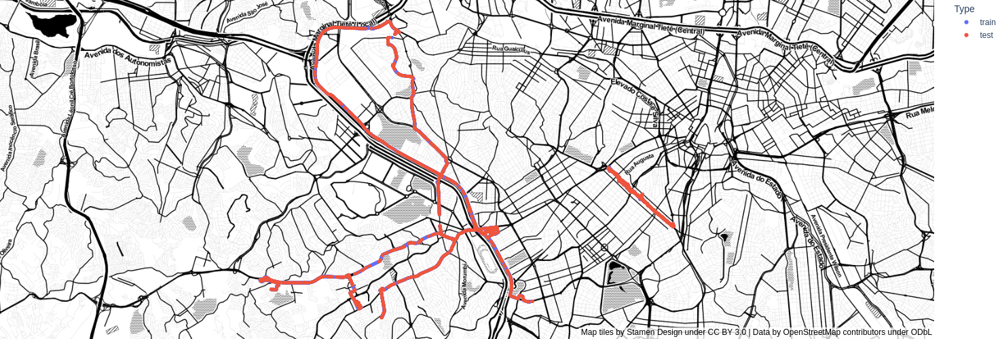

**Desempenho do regressor (R2 Score)**

treinamento: 0.6551420897308271

teste: 0.5967629429074507

**Nível de importância dos atributos para a predição do rótulo**

Longitude: 0.47

Latitude: 0.38

Altitude: 0.15

In [8]:
# importando as bibliotecas de apoio
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import plotly.express as px

x = x_qual
y = y_qual

# 1. Subdvidindo o conjunto de dados entre os subconjuntos de treinamento e teste.
# notem que neste caso os dados não estão sendo tratados como uma série temporal,
# assim, podemos selecionar as amostras de treinamento e teste de forma aleatória
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle=True, random_state=42)

df_train = x_train.copy()
df_train['Type'] = 'train'

df_test = x_test.copy()
df_test['Type'] = 'test'

fig = px.scatter_mapbox(pd.concat([df_train, df_test]), lat='Latitude', lon='Longitude', color='Type',
                        size_max=20, zoom=11.8, width=1000, height=500,
                        center=dict(lon=(df.Longitude.min() + df.Longitude.max()) / 2, lat=(df.Latitude.min() + df.Latitude.max()) / 2))
fig.update_layout(mapbox=dict(style='stamen-toner'), margin=dict(l=0, r=0, t=0, b=0))

display(Markdown('**Quantidade de amostras (embaralhadas)**'))
display(Markdown(f'treinamento: {len(x_train)}'))
display(Markdown(f'teste: {len(x_test)}'))
display(fig)

# 2. Convertendo y para array 1D
y_train = np.ravel(y_train)
y_test = np.ravel(y_test)

# 3. Treinando um regressor baseado em Random Forest
model = RandomForestRegressor(n_estimators=20, random_state=42).fit(x_train, y_train)

# 4. Avaliando o desempenho do regressor
display(Markdown('**Desempenho do regressor (R2 Score)**'))
display(Markdown(f'treinamento: {model.score(x_train, y_train)}'))
display(Markdown(f'teste: {model.score(x_test, y_test)}'))

# 5. Exibindo o nível de importância dos atributos selecionados para a predição do rótulo
display(Markdown('**Nível de importância dos atributos para a predição do rótulo**'))

importances = list(model.feature_importances_)
for i in range(len(x.columns)):
    display(Markdown(f'{x.columns[i]}: {importances[i]:.2f}'))

Ainda que esta simples aplicação tenha proporcionado um resultado inicial moderadamente bom, notem que essa não é a resposta:

De forma que os conjuntos de treinamento e teste são separados de forma aleatória, o modelo acaba aprendendo a qualidade de sinal para coordenadas vizinhas, fazendo apenas a interpolação da métrica `Qual` entre coordenadas. Nesse cenário, não é possível fazer a predição para regiões onde não se fez uma coleta de dados.

Observe o que acontece se dividirmos o conjunto de dados sem realizar o passo de embaralhamento dos dados para simular a situação de predição para novas regiões:

**Quantidade de amostras (em ordem natural)**

treinamento: 26646

teste: 6662

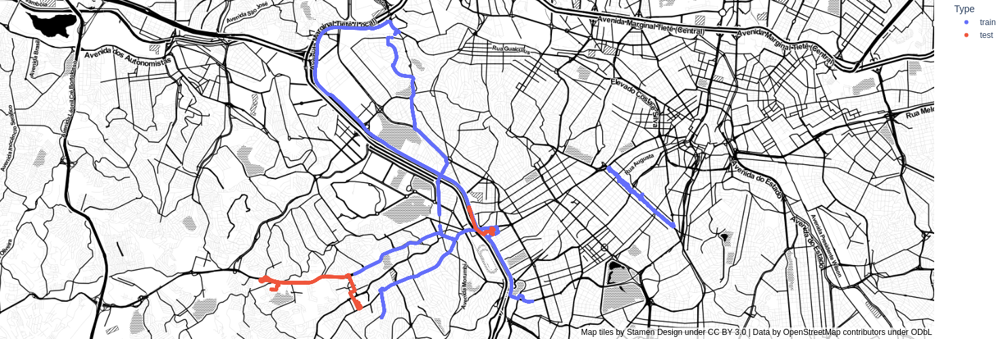

**Desempenho do regressor (R2 Score)**

treinamento: 0.6757606308291543

teste: -0.32377214598023296

**Nível de importância dos atributos para a predição do rótulo**

Longitude: 0.45

Latitude: 0.43

Altitude: 0.12

In [9]:
x = x_qual
y = y_qual

# 1. Subdvidindo o conjunto de dados entre os subconjuntos de treinamento e teste.
# neste caso os dados estão sendo tratados como uma série temporal, sendo necessário
# selecionar as amostras de treinamento e teste de forma a não "ver o futuro"
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle=False)

df_train = x_train.copy()
df_train['Type'] = 'train'

df_test = x_test.copy()
df_test['Type'] = 'test'

fig = px.scatter_mapbox(pd.concat([df_train, df_test]), lat='Latitude', lon='Longitude', color='Type',
                        size_max=20, zoom=11.8, width=1000, height=500,
                        center=dict(lon=(df.Longitude.min() + df.Longitude.max()) / 2, lat=(df.Latitude.min() + df.Latitude.max()) / 2))
fig.update_layout(mapbox=dict(style='stamen-toner'), margin=dict(l=0, r=0, t=0, b=0))

display(Markdown('**Quantidade de amostras (em ordem natural)**'))
display(Markdown(f'treinamento: {len(x_train)}'))
display(Markdown(f'teste: {len(x_test)}'))
display(fig)

# 2. Convertendo y para array 1D
y_train = np.ravel(y_train)
y_test = np.ravel(y_test)

# 3. Treinando um regressor baseado em Random Forest
model = RandomForestRegressor(n_estimators=20, random_state=42).fit(x_train, y_train)

# 4. Avaliando o desempenho do regressor
display(Markdown('**Desempenho do regressor (R2 Score)**'))
display(Markdown(f'treinamento: {model.score(x_train, y_train)}'))
display(Markdown(f'teste: {model.score(x_test, y_test)}'))

# 5. Exibindo o nível de importância dos atributos selecionados para a predição do rótulo
display(Markdown('**Nível de importância dos atributos para a predição do rótulo**'))

importances = list(model.feature_importances_)
for i in range(len(x.columns)):
    display(Markdown(f'{x.columns[i]}: {importances[i]:.2f}'))

Veja como uma simples alteração na divisão dos conjuntos de treinamento e teste pode resultar em uma grande diferença na avaliação do modelo (como também pode revelar suas falhas conceituais).

Deste modo, as equipes devem testar novos tipos de representação de dados, incluindo a seleção e engenharia de atributos, novas proporções de divisão dos conjuntos de treinamento e teste, entre outras técnicas que podem ser determinantes para a predição da qualidade do sinal de forma assertiva.

A escolha do algoritmo e o ajuste adequado de seus hiperparâmetros também estão diretamente relacionados com o desempenho da predição.

## Predição da ocupação do buffer de transmissão de vídeo

Outra demonstração que podemos fazer seguindo a mesma linha do exemplo anterior, é: prever a ocupação do buffer de transmissão de vídeo. O modelo que vamos fazer considera a localização geográfica do dispositivo (`Longitude`, `Latitude` e `Altitude`) e o tempo desde que a sessão do vídeo se iniciou (em segundos), sem correlacionar com nenhuma característica do ambiente (como a disponibilidade de antenas ao redor).

De modo que a localização está disponível do conjunto de dados `g-nettrack` e as métricas de transmissão do vídeo no `youtube-qoe`, devemos combinar os dois. Há diversas técnicas para fazer isso, a mais simples é utilizar o método [`pd.merge_asof`](https://pandas.pydata.org/docs/reference/api/pandas.merge_asof.html), que realiza o a combinação de Dataframes com base na distância entre chaves.

Vamos realizar a combinação dos Dataframes com base nos campos de tempo:

In [10]:
ytGnetDf = pd.merge_asof(ytDf, gnetDf, left_on='time', right_on='Timestamp', direction='nearest').copy()
ytGnetDf

,time,time_seconds,session_time,fmt,afmt,cpn,el,ns,fexp,cl,seq,docid,ei,event,plid,cbrand,cbr,cbrver,c,cver,cplayer,cmodel,cos,cosver,cplatform,afs,vfs,vis,conn,user_intent,ctmp,referrer,sdetail,sourceid,feature,content_v,adformat,adcontext,ad_playback,qoealert,vps.value,cmt.value,bh.value,bwe.value,df.value,bwm.downloaded_bytes,bwm.seconds_to_download,bat.percentage,bat.is_charging,view.width,view.height,Timestamp,Timestamp_seconds,Longitude,Latitude,Speed,Operatorname,Operator,CGI,Cellname,Node,CellID,LAC,NetworkTech,NetworkMode,Level,Qual,SNR,CQI,LTERSSI,ARFCN,DL_bitrate,UL_bitrate,PSC,Altitude,Height,Accuracy,Location,State,PINGAVG,PINGMIN,PINGMAX,PINGSTDEV,PINGLOSS,TESTDOWNLINK,TESTUPLINK,TESTDOWNLINKMAX,TESTUPLINKMAX,Test_Status,DataConnection_Type,DataConnection_Info,Layer,Filemark,IMEI,Distance,Bearing,IP,TA,EVENT,EVENTDETAILS,IMSI,MSISDN,SERVINGTIME,CELLHEX,NODEHEX,LACHEX,RAWCELLID,VERSION_NAME,VERSION_CODE,DEVICE,BAND,BANDWIDTH,INFO,SecondCell_NODE,SecondCell_CELLID,SecondCell_RSRP,SecondCell_RSRQ,SecondCell_SNR,CSI_RSRP,CSI_RSRQ,CSI_SNR,NetworkTypeNum,CA,SecondCell_PSC,SecondCell_ARFCN,SecondCell_BAND,Site_BEARING,BATTERY,CHARGING,NRSTATE,R4,NTech1,NCellName1,NCellid1,NLAC1,NCell1,NARFCN1,NRxLev1,NQual1,NDistance1,NBearing1,NTech2,NCellName2,NCellid2,NLAC2,NCell2,NARFCN2,NRxLev2,NQual2,NDistance2,NBearing2,NTech3,NCellName3,NCellid3,NLAC3,NCell3,NARFCN3,NRxLev3,NQual3,NDistance3,NBearing3,NTech4,NCellName4,NCellid4,NLAC4,NCell4,NARFCN4,NRxLev4,NQual4,NDistance4,NBearing4,NTech5,NCellName5,NCellid5,NLAC5,NCell5,NARFCN5,NRxLev5,NQual5,NDistance5,NBearing5,NTech6,NCellName6,NCellid6,NLAC6,NCell6,NARFCN6,NRxLev6,NQual6,NDistance6,NBearing6,NTech7,NCellName7,NCellid7,NLAC7,NCell7,NARFCN7,NRxLev7,NQual7,NDistance7,NBearing7,NTech8,NCellName8,NCellid8,NLAC8,NCell8,NARFCN8,NRxLev8,NQual8,NDistance8,NBearing8,NTech9,NCellName9,NCellid9,NLAC9,NCell9,NARFCN9,NRxLev9,NQual9,NDistance9,NBearing9,NTech10,NCellName10,NCellid10,NLAC10,NCell10,NARFCN10,NRxLev10,NQual10,NDistance10,NBearing10,NTech11,NCellName11,NCellid11,NLAC11,NCell11,NARFCN11,NRxLev11,NQual11,NDistance11,NBearing11,NTech12,NCellName12,NCellid12,NLAC12,NCell12,NARFCN12,NRxLev12,NQual12,NDistance12,NBearing12,NTech13,NCellName13,NCellid13,NLAC13,NCell13,NARFCN13,NRxLev13,NQual13,NDistance13,NBearing13,NTech14,NCellName14,NCellid14,NLAC14,NCell14,NARFCN14,NRxLev14,NQual14,NDistance14,NBearing14,NTech15,NCellName15,NCellid15,NLAC15,NCell15,NARFCN15,NRxLev15,NQual15,NDistance15,NBearing15,NTech16,NCellName16,NCellid16,NLAC16,NCell16,NARFCN16,NRxLev16,NQual16,NDistance16,NBearing16,NTech17,NCellName17,NCellid17,NLAC17,NCell17,NARFCN17,NRxLev17,NQual17,NDistance17,NBearing17,NTech18,NCellName18,NCellid18,NLAC18,NCell18,NARFCN18,NRxLev18,NQual18,NDistance18,NBearing18,Unnamed: 259
0,2023-02-17 02:20:03.329911040,1676600403.329911,0.0,243,251,oMaRrct9XOA6WR0D,detailpage,yt,"23848211,23983296,24004644,24007246,24080738,2...",509820939,1,d5r-kEmQfBg,gA7vY83zJeyPobIPq_OcmAg,streamingstats,AAX03ncKwXUwJiIT,samsung,Chrome Mobile,109.0.0.0,MWEB,2.20230215.10.00,UNIPLAYER,sm-g991b,Android,13,MOBILE,0.008:251::i,0.008:243:243::d,0.008:0,0.008:1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unstarted/cued,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-02-24 16:35:15,1677256515.0,-46.736235,-23.584129,87.0,CLARO_BR,72405,724054571100030,NaN,110857.0,30,45711,5G,5G,-92.0,-3.0,0.0,11.0,NaN,250.0,0.0,0.0,421.0,753.0,753.0,6.0,G,I,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,M,13,1,NaN,NaN,-1,1000,10.65.70.236,6.0,LOG START,NaN,NaN,NaN,3,1E,1B109,B28F,28379422,28.3,549,samsung:SM-G991B:TP1A.220624.014,L1,20/100,NaN,110857.0,30.0,-87.0,-12.0,4.0,NaN,NaN,NaN,13,False,421.0,250.0,L1,1000,95,False,NaN,NaN,4G,NaN,110857-30,45711.0,421.0,250.0,-87.0,-12.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

Observe que a distância entre o tempo mais próximo chega a ser muito grande em alguns casos. Tais valores não são interessantes, logo, vamos remover as entradas cuja distância temporal entre os valores entre `g-nettrack` e `youtube-qoe` seja maior do que o quantil 94,3% (o que resulta em diferença de 1,96 segundos, para esses dados)

In [11]:
ytGnetDf['time_diff'] = ytGnetDf.time_seconds - ytGnetDf.Timestamp_seconds
ytGnetDf.time_diff.abs().describe()

count           783.0
mean     17595.344474
std     106054.667125
min          0.000745
25%          0.153856
50%          0.243994
75%          0.370277
max     656111.670089
Name: time_diff, dtype: float64

In [12]:
q = ytGnetDf.time_diff.abs().quantile(.943)
q

1.9602654652594174

In [13]:
ytGnetDf.drop(ytGnetDf[ytGnetDf.time_diff.abs() > q].index, inplace=True)
ytGnetDf.time_diff.abs().describe()

count      738.0
mean    0.249724
std     0.145148
min     0.000745
25%     0.153856
50%     0.226900
75%     0.335434
max     1.130006
Name: time_diff, dtype: float64

<AxesSubplot:>

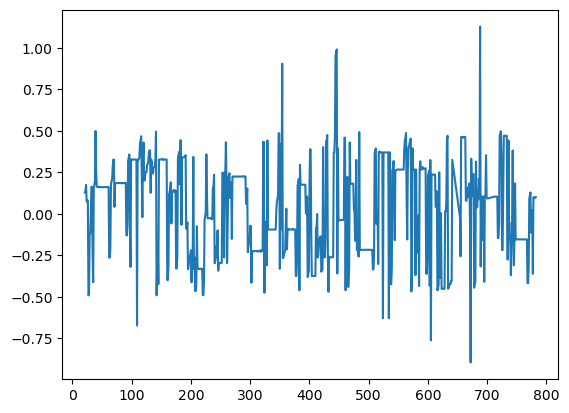

In [14]:
ytGnetDf.time_diff.plot()

Feito isso, finalmente vamos selecionar os atributos desejados para o modelo

In [15]:
# removendo entradas com valores nulos
df = ytGnetDf[['Longitude', 'Latitude', 'Altitude', 'session_time', 'bh.value']].dropna()

# selecionando os atributos (x) e os rótulos (y) para a predição
x_bh = df.reindex(columns=['Longitude', 'Latitude', 'Altitude', 'session_time'])
y_bh = df.reindex(columns=['bh.value'])

display(Markdown('### Atributos'))
display(x_bh)

display(Markdown('### Rótulos'))
display(y_bh)

### Atributos

,Longitude,Latitude,Altitude,session_time
22,-46.732104,-23.582088,762.0,0.012
26,-46.731691,-23.581906,764.0,1.952
29,-46.731281,-23.581732,767.0,0.374
30,-46.731281,-23.581732,767.0,0.374
31,-46.731092,-23.581646,769.0,1.49
...,...,...,...,...
778,-46.76133,-23.585315,774.0,10.008
779,-46.763509,-23.585536,773.0,50.007
780,-46.759189,-23.586328,771.0,90.002
781,-46.758418,-23.586762,772.0,120.008


### Rótulos

,bh.value
22,0.0
26,0.0
29,0.0
30,0.0
31,8.581
...,...
778,40.964
779,90.848
780,104.738
781,120.901


Vamos utilizar o primeiro método que realizamos para predizer a métrica `Qual`, mas, dessa vez, para predizer a ocupação do buffer (`bh.value`).

**Quantidade de amostras (embaralhadas)**

treinamento: 478

teste: 120

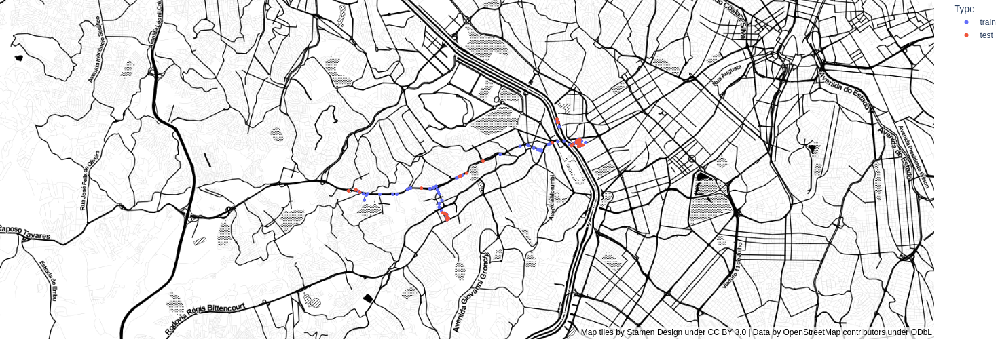

**Desempenho do regressor (R2 Score)**

treinamento: 0.9732099442242427

teste: 0.7732023960051213

**Nível de importância dos atributos para a predição do rótulo**

Longitude: 0.06

Latitude: 0.09

Altitude: 0.08

session_time: 0.77

In [16]:
x = x_bh
y = y_bh

# 1. Subdvidindo o conjunto de dados entre os subconjuntos de treinamento e teste.
# amostras de treinamento e teste sendo selecionadas de forma aleatória
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle=True, random_state=42)

df_train = x_train.copy()
df_train['Type'] = 'train'

df_test = x_test.copy()
df_test['Type'] = 'test'

fig = px.scatter_mapbox(pd.concat([df_train, df_test]), lat='Latitude', lon='Longitude', color='Type',
                        size_max=20, zoom=11.8, width=1000, height=500,
                        center=dict(lon=(df.Longitude.min() + df.Longitude.max()) / 2, lat=(df.Latitude.min() + df.Latitude.max()) / 2))
fig.update_layout(mapbox=dict(style='stamen-toner'), margin=dict(l=0, r=0, t=0, b=0))

display(Markdown('**Quantidade de amostras (embaralhadas)**'))
display(Markdown(f'treinamento: {len(x_train)}'))
display(Markdown(f'teste: {len(x_test)}'))
display(fig)

# 2. Convertendo y para array 1D
y_train = np.ravel(y_train)
y_test = np.ravel(y_test)

# 3. Treinando um regressor baseado em Random Forest
model = RandomForestRegressor(n_estimators=20, random_state=42).fit(x_train, y_train)

# 4. Avaliando o desempenho do regressor
display(Markdown('**Desempenho do regressor (R2 Score)**'))
display(Markdown(f'treinamento: {model.score(x_train, y_train)}'))
display(Markdown(f'teste: {model.score(x_test, y_test)}'))

# 5. Exibindo o nível de importância dos atributos selecionados para a predição do rótulo
display(Markdown('**Nível de importância dos atributos para a predição do rótulo**'))

importances = list(model.feature_importances_)
for i in range(len(x.columns)):
    display(Markdown(f'{x.columns[i]}: {importances[i]:.2f}'))

Observe como o modelo obteve um desempenho muito superior no conjunto de treinamento, mas teve uma redução de 0,2 no teste. Isso indica que há um sobreajuste (_overfitting_) do modelo.

Da mesma forma como anteriormente, a separação dos conjuntos de teste e treinamento influenciam na qualidade do modelo. Tal como anteriormente, está sendo feita uma interpolação da métrica `bh.value`.

Para corrigir esse problema, podemos treinar usando diferentes sessões de transmissão, isto é, usar sessões inteiras, em vez de pedaços aleatórios.

As sessões são identificadas pelo identificador `CPN`. Assim, basta enumerar os identificadores existentes, selecionar a proporção adequada para testes e treinamento, e separar as entradas de acordo com os CPNs selecionados para cada conjunto.

In [17]:
# removendo entradas com valores nulos
df = ytGnetDf[['Longitude', 'Latitude', 'Altitude', 'session_time', 'bh.value', 'cpn']].dropna()

# selecionando os atributos (x) e os rótulos (y) para a predição
x_bh_cpn = df.reindex(columns=['Longitude', 'Latitude', 'Altitude', 'session_time', 'cpn'])
y_bh_cpn = df.reindex(columns=['bh.value', 'cpn'])

display(Markdown('### Atributos'))
display(x_bh_cpn)

display(Markdown('### Rótulos'))
display(y_bh_cpn)

### Atributos

,Longitude,Latitude,Altitude,session_time,cpn
22,-46.732104,-23.582088,762.0,0.012,4vlt2TcFloAd5ood
26,-46.731691,-23.581906,764.0,1.952,4vlt2TcFloAd5ood
29,-46.731281,-23.581732,767.0,0.374,ScmBnHv2dedPCNso
30,-46.731281,-23.581732,767.0,0.374,ScmBnHv2dedPCNso
31,-46.731092,-23.581646,769.0,1.49,ScmBnHv2dedPCNso
...,...,...,...,...,...
778,-46.76133,-23.585315,774.0,10.008,8qT53QJIe-uAItWx
779,-46.763509,-23.585536,773.0,50.007,8qT53QJIe-uAItWx
780,-46.759189,-23.586328,771.0,90.002,8qT53QJIe-uAItWx
781,-46.758418,-23.586762,772.0,120.008,8qT53QJIe-uAItWx


### Rótulos

,bh.value,cpn
22,0.0,4vlt2TcFloAd5ood
26,0.0,4vlt2TcFloAd5ood
29,0.0,ScmBnHv2dedPCNso
30,0.0,ScmBnHv2dedPCNso
31,8.581,ScmBnHv2dedPCNso
...,...,...
778,40.964,8qT53QJIe-uAItWx
779,90.848,8qT53QJIe-uAItWx
780,104.738,8qT53QJIe-uAItWx
781,120.901,8qT53QJIe-uAItWx


**Quantidade de amostras (separados por CPN)**

treinamento: 459

teste: 139

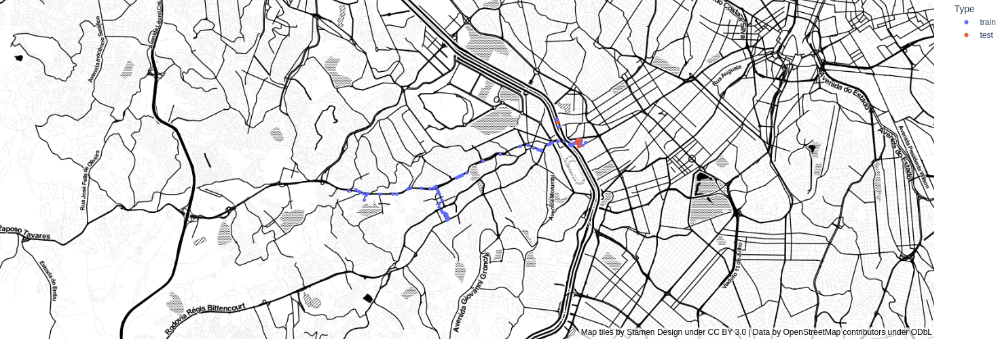

**Desempenho do regressor (R2 Score)**

treinamento: 0.9630757386913956

teste: 0.5270268901365674

**Nível de importância dos atributos para a predição do rótulo**

Longitude: 0.08

Latitude: 0.06

Altitude: 0.10

session_time: 0.76

In [18]:
x = x_bh_cpn
y = y_bh_cpn

# 1. Subdvidindo o conjunto de dados entre os subconjuntos de treinamento e teste.
# as amostras de treinamento e teste escolhidas de acordo com o CPN
cpn = pd.Series(ytGnetDf.cpn.unique())
test = cpn.sample(frac=0.2, random_state=42)
train = cpn[~cpn.isin(test)]

x_test = x[x.cpn.isin(test)].drop(columns=['cpn'])
y_test = y[y.cpn.isin(test)].drop(columns=['cpn'])

x_train = x[x.cpn.isin(train)].drop(columns=['cpn'])
y_train = y[x.cpn.isin(train)].drop(columns=['cpn'])

df_train = x_train.copy()
df_train['Type'] = 'train'

df_test = x_test.copy()
df_test['Type'] = 'test'

fig = px.scatter_mapbox(pd.concat([df_train, df_test]), lat='Latitude', lon='Longitude', color='Type',
                        size_max=20, zoom=11.8, width=1000, height=500,
                        center=dict(lon=(df.Longitude.min() + df.Longitude.max()) / 2, lat=(df.Latitude.min() + df.Latitude.max()) / 2))
fig.update_layout(mapbox=dict(style='stamen-toner'), margin=dict(l=0, r=0, t=0, b=0))

display(Markdown('**Quantidade de amostras (separados por CPN)**'))
display(Markdown(f'treinamento: {len(x_train)}'))
display(Markdown(f'teste: {len(x_test)}'))
display(fig)

# 2. Convertendo y para array 1D
y_train = np.ravel(y_train)
y_test = np.ravel(y_test)

# 3. Treinando um regressor baseado em Random Forest
model = RandomForestRegressor(n_estimators=20, random_state=42).fit(x_train, y_train)

# 4. Avaliando o desempenho do regressor
display(Markdown('**Desempenho do regressor (R2 Score)**'))
display(Markdown(f'treinamento: {model.score(x_train, y_train)}'))
display(Markdown(f'teste: {model.score(x_test, y_test)}'))

# 5. Exibindo o nível de importância dos atributos selecionados para a predição do rótulo
display(Markdown('**Nível de importância dos atributos para a predição do rótulo**'))

importances = list(model.feature_importances_)
for i in range(len(x.drop(columns=['cpn']).columns)):
    display(Markdown(f'{x.columns[i]}: {importances[i]:.2f}'))

Dessa vez, essa alteração não resultou em ganhos na avaliação do modelo.

Apesar disso, veja que a análise do nível de importância dos atributos para predizer a ocupação do buffer se dá principalmente pelo tempo decorrido da sessão, não pela localização geográfica. Ainda é possível descobrir outras relações entre atributos, ou padrões de acordo com a localização (caso utilizarmos mais informações, tal como incluir o `mosaico` no modelo).